In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import rubin_sim.maf as maf

In [17]:
families = maf.archive.get_family_descriptions()
family_list = families.index.values
summary_source = 'summary_2022_10_31.csv'
summaries = maf.get_metric_summaries(summary_source=summary_source)
metrics_source = 'metric_sets.json'
metric_sets = maf.get_metric_sets(metrics_source)

In [18]:
msets = metric_sets.groupby('metric set').first().index.to_list()

In [5]:
t = families.explode(['run', 'filepath']).loc['baseline', ['run', 'filepath']].set_index('run')

baseline_run = 'baseline_v2.2_10yrs'

ddir = os.getenv("OPSIM_DB_DIR")
if ddir is None:
    ddir = '/Users/lynnej/opsim'
    
opsdb = os.path.join(ddir, t.loc[baseline_run]['filepath'])
runName = baseline_run

outDir = 'footprint_test'
m = maf.CountMetric('observationStartMJD',)
s = maf.HealpixSlicer(nside=64)
b = maf.MetricBundle(m, s, None, runName=runName)
g = maf.MetricBundleGroup({'sky': b,}, opsdb, outDir=outDir)
g.runAll()

Healpix slicer using NSIDE=64, approximate resolution 54.967783 arcminutes


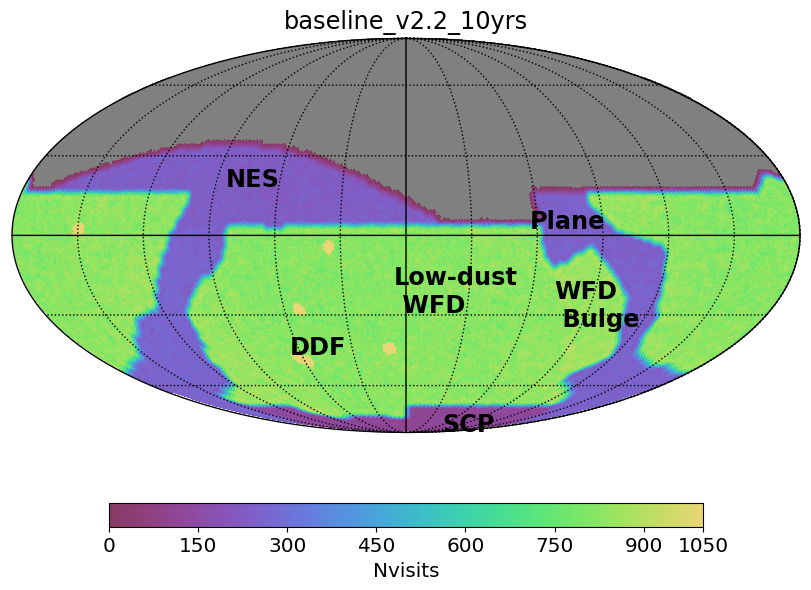

In [6]:
figformat = 'png'
ph = maf.PlotHandler(savefig=False, figformat=figformat, thumbnail=False, dpi=270, outDir=outDir)
ph.setMetricBundles([b])
ph.plot(plotFunc=maf.plots.HealpixSkyMap(), 
        plotDicts={'colorMin': 0, 'colorMax':1000, 'figsize': (8, 7),  'nTicks': 7,
                   'labelsize': 'x-large', 'fontsize':'x-large', 'xlabel': "Nvisits"})
plt.figtext(0.49, 0.42, 'Low-dust\n WFD', fontsize='xx-large', fontweight='bold')
plt.figtext(0.28, 0.6, r'NES', fontsize='xx-large', fontweight='bold')
plt.figtext(0.69, 0.40, 'WFD\n Bulge', fontsize='xx-large', fontweight='bold')
plt.figtext(0.66, 0.54, r'Plane', fontsize='xx-large', fontweight='bold')
plt.figtext(0.55, 0.25, r'SCP', fontsize='xx-large', fontweight='bold')
plt.figtext(0.36, 0.36, r'DDF', fontsize='xx-large', fontweight='bold')
plt.title(f'{runName}', fontsize='xx-large', fontweight='normal')
# We have to save the figure separately, because otherwise the labels won't be saved.
plt.savefig(os.path.join(outDir, f'{runName}_nvisits.{figformat}' ), 
            facecolor='w', edgecolor='w', bbox_inches='tight',dpi=270, format=figformat)

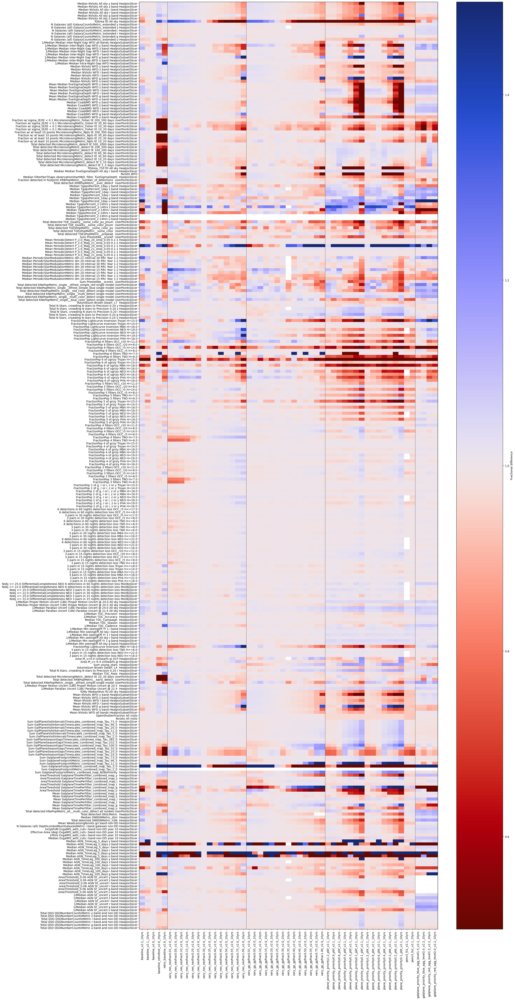

In [25]:
fams = ['baseline', 'vary nes', 'vary gp', 'galactic plane footprint', 'galactic plane footprint v2']
baseline_run = 'baseline_v2.0_10yrs'
these_runs = families.explode('run').loc[fams]['run']
lines = maf.find_family_lines(families, fams)

# We can plot them all together, but need to remove duplicates
non_dd = [m for m in msets if 'DD' not in m]
msub = metric_sets.loc[non_dd].reset_index(drop=True).drop('style', axis=1).drop('short_name', axis=1)
msub = msub.drop_duplicates().set_index('metric', drop=False, verify_integrity=True)

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(24)
fig.set_figheight(60)

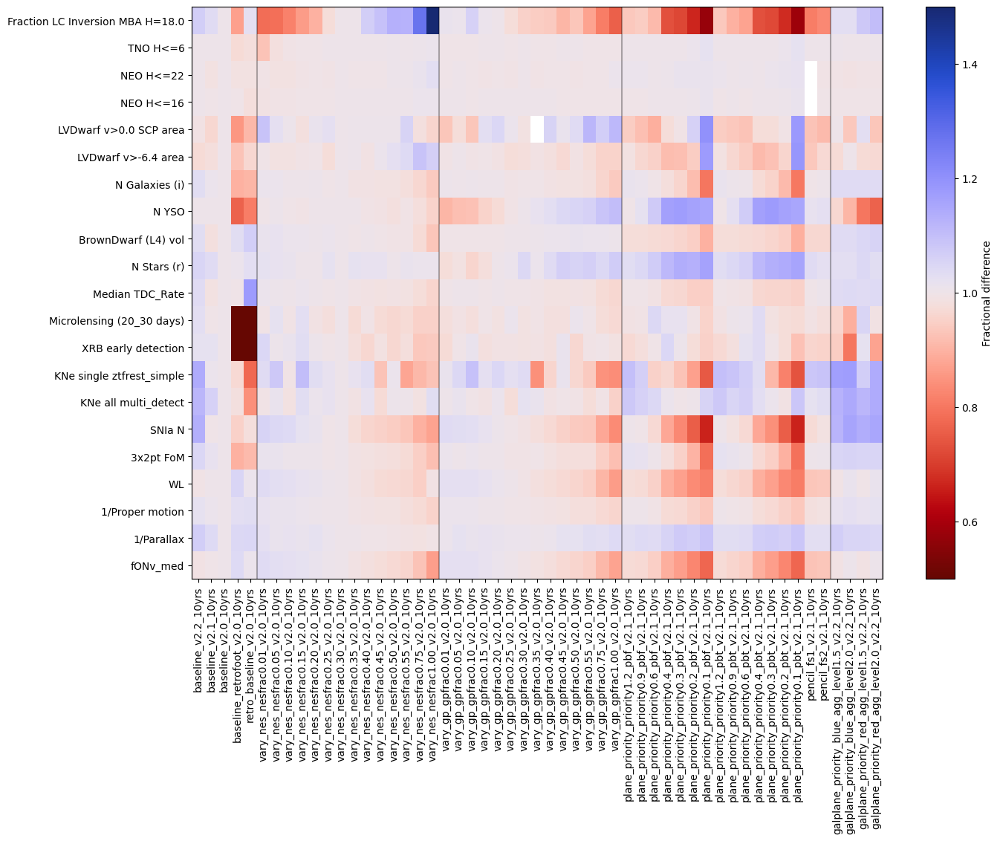

In [26]:
msub = metric_sets.loc['SCOC']
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=1)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)

fig.set_figwidth(15)
fig.set_figheight(10)

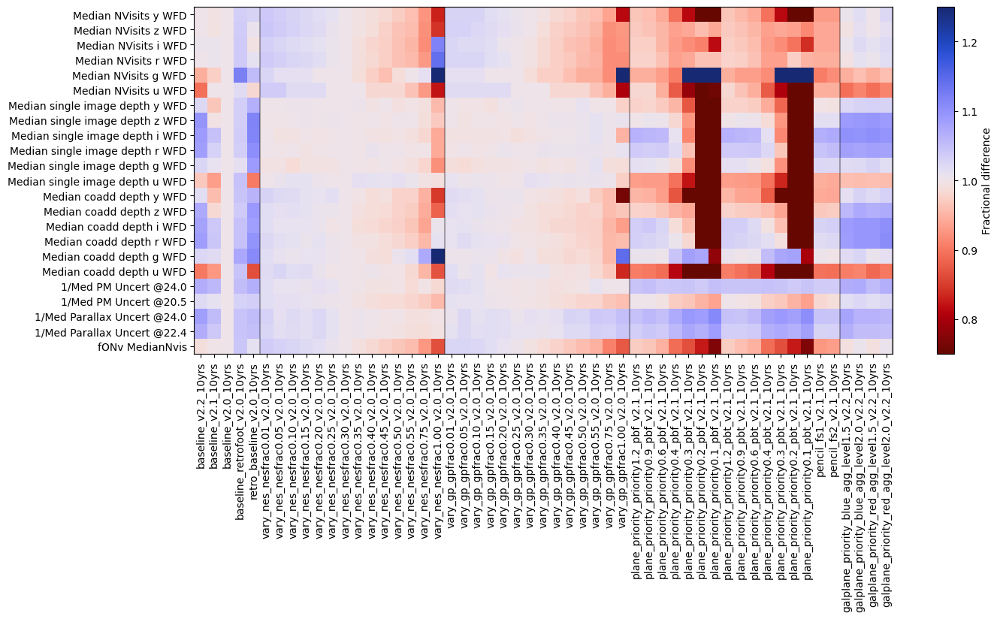

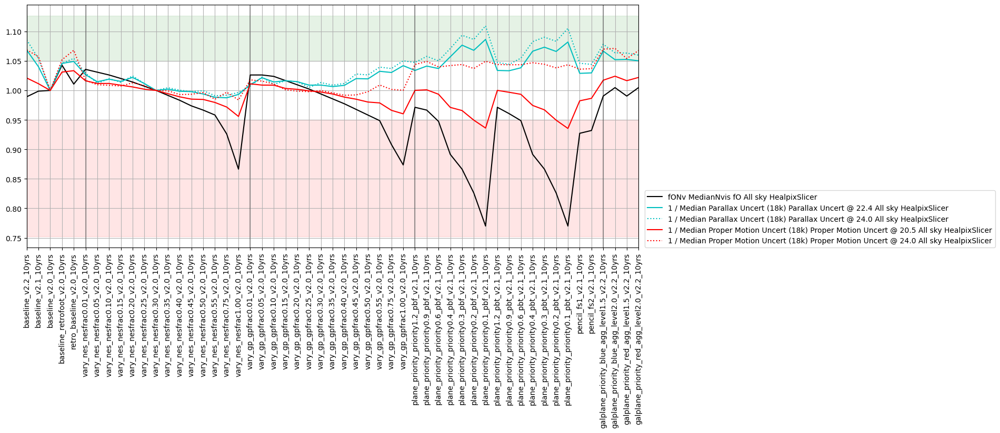

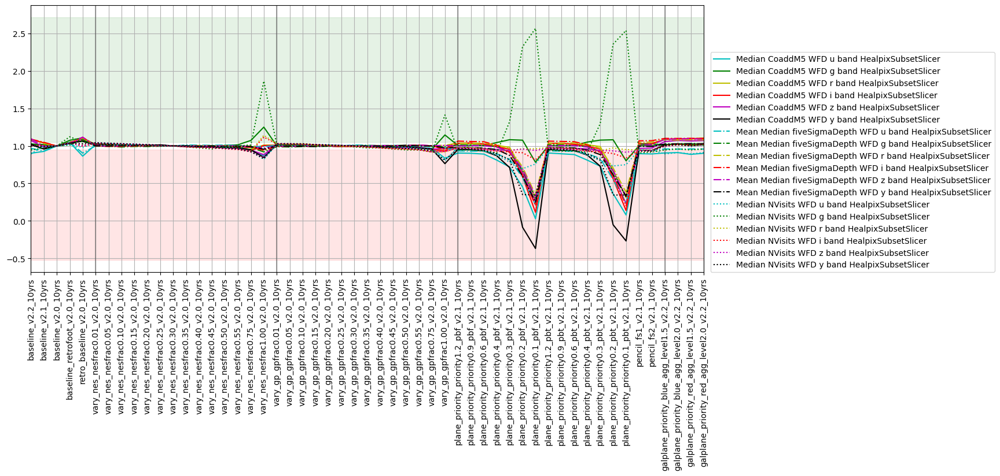

In [31]:
# Very basic metrics 

msub = metric_sets.loc[['SRD', 'WFD Depths']].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)

msub = metric_sets.loc['SRD']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)
lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

msub = metric_sets.loc['WFD Depths']
fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']],
                             baseline_run=baseline_run,
                             metric_set=msub,
                            horizontal_quantity='run', 
                             vertical_quantity='value')
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)
lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

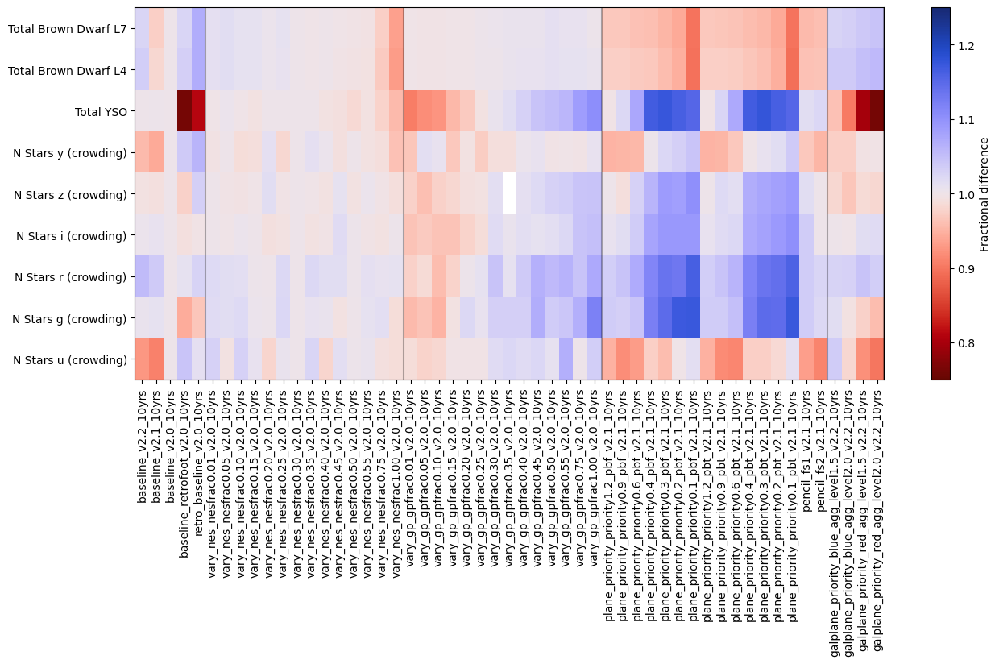

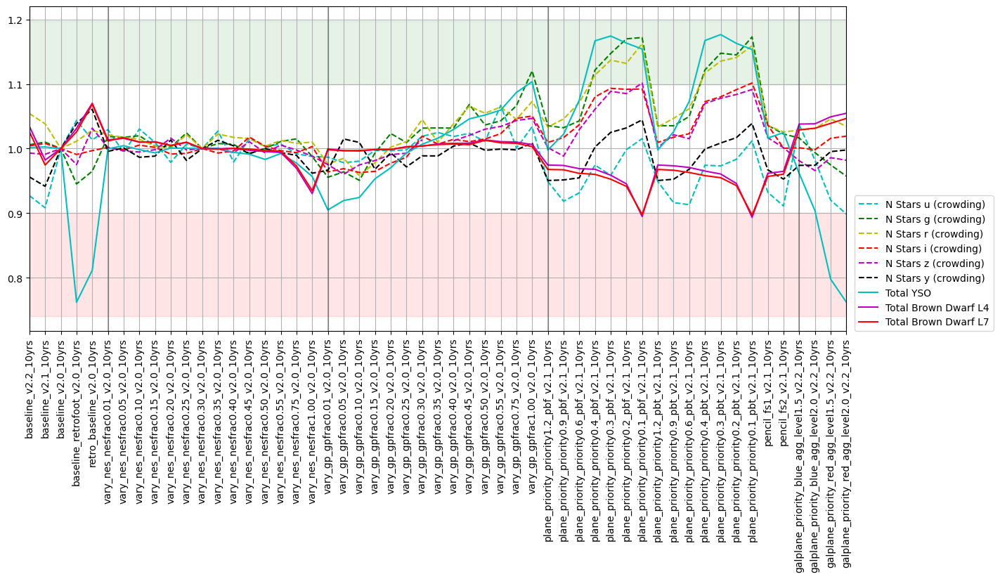

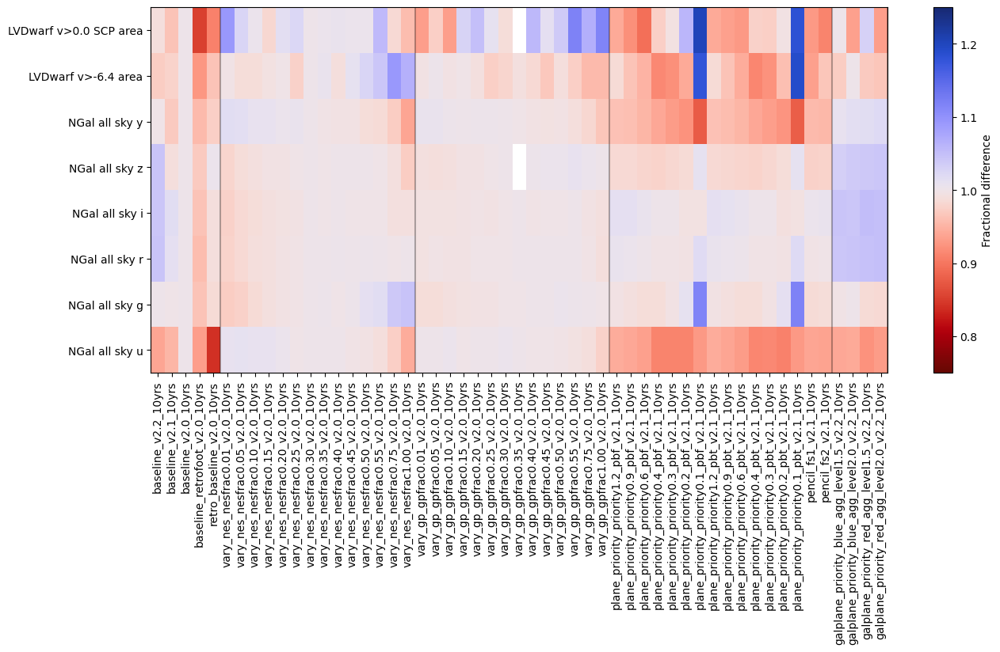

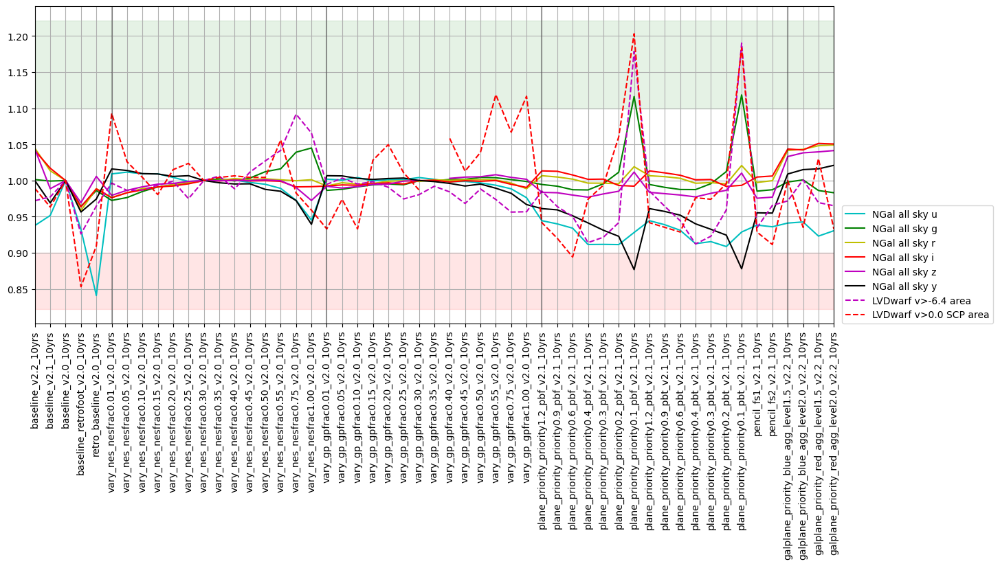

In [29]:
# Stars and Galaxy counts metrics
k_sets = ['Stars', 'galaxies']
for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    fig.set_figwidth(15)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(2, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

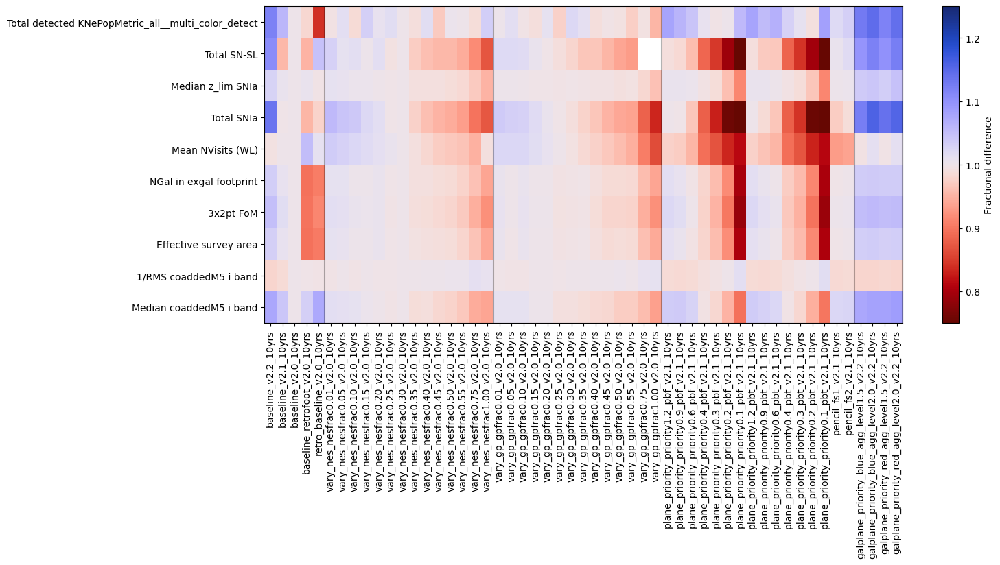

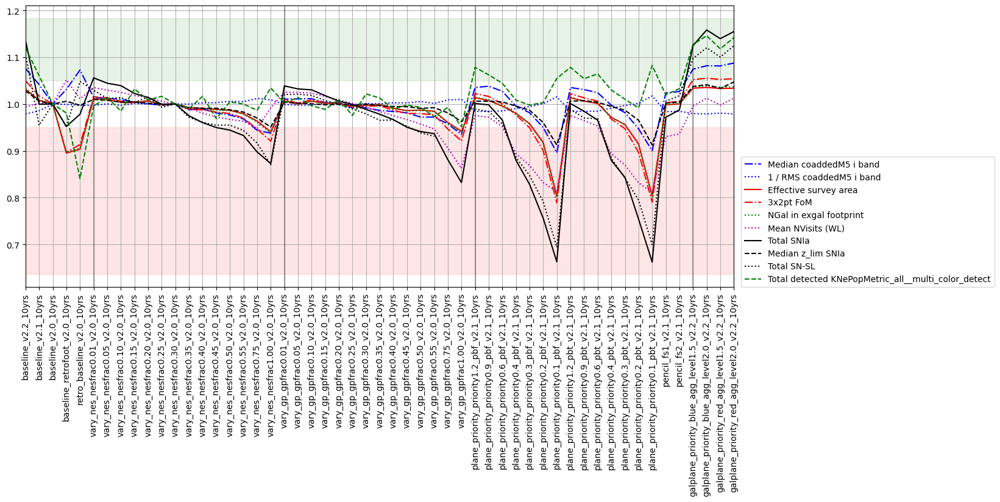

In [30]:
# DESC metrics
k_sets = [k for k in msets if k.startswith('DESC') and not k.endswith('DDF')]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)

SSO discovery
SSO lightcurve inversion


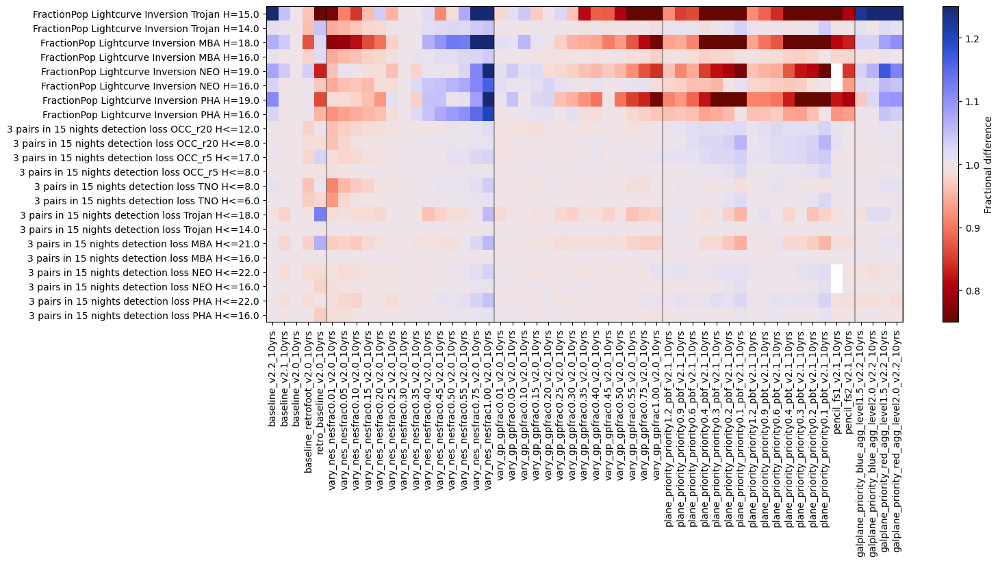

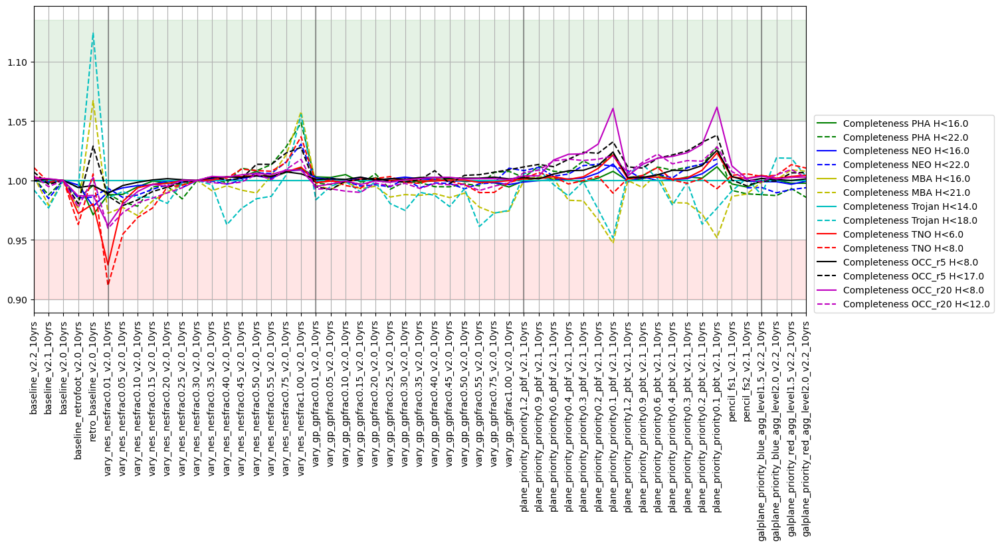

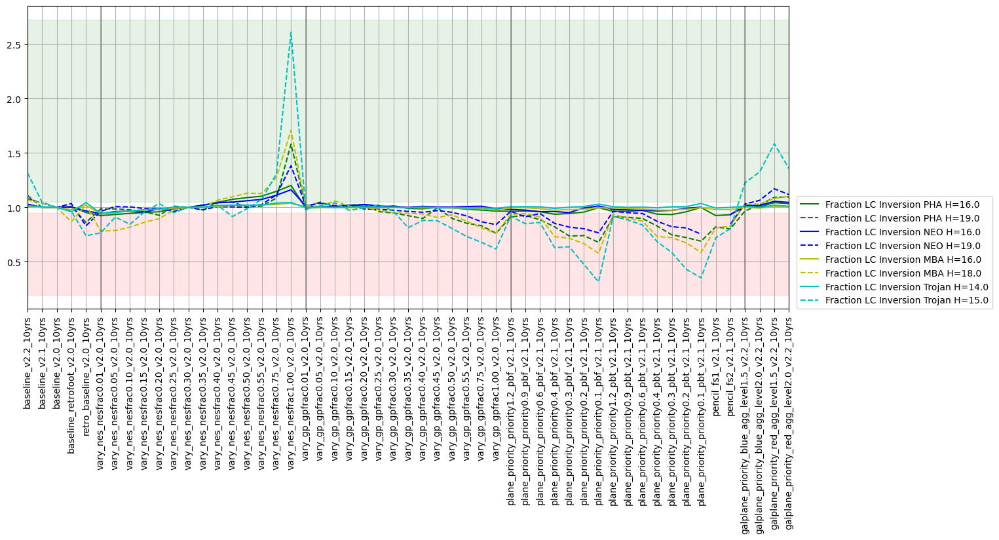

In [32]:
# sso metrics
k_sets = ['SSO discovery', 'SSO lightcurve inversion']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs, msub['metric']], 
                                   baseline_run=baseline_run,
                                   #metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)


for k in k_sets:
    print(k)
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

/Users/lynnej/lsst_repos/rubin_sim/rubin_sim/maf/runComparison/summary_plots.py:326: UserWarning: There are infinite values in the plot of Median TgapsPercent_2-14hrs u band.
  warnings.warn(f"There are infinite values in the plot of {idx}.")


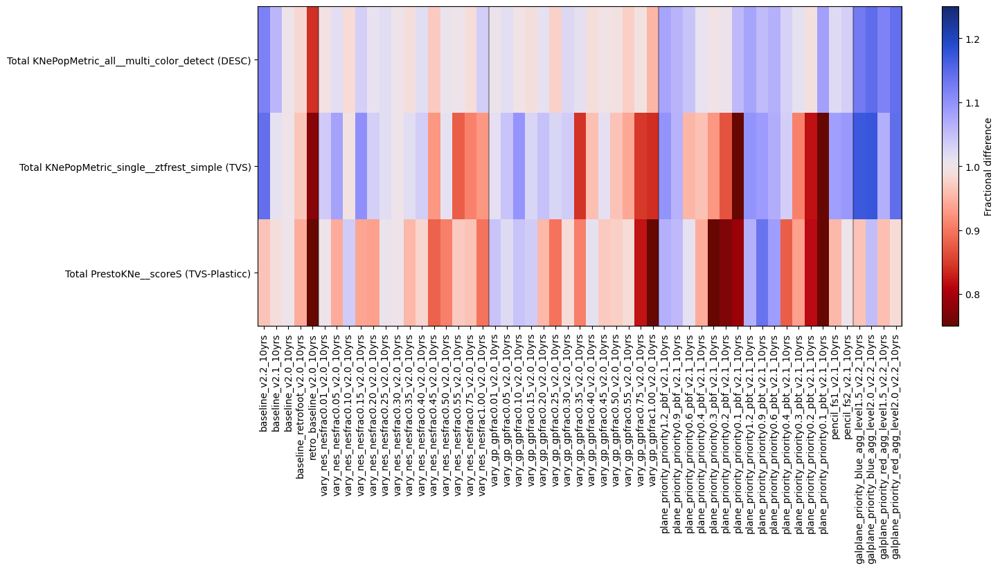

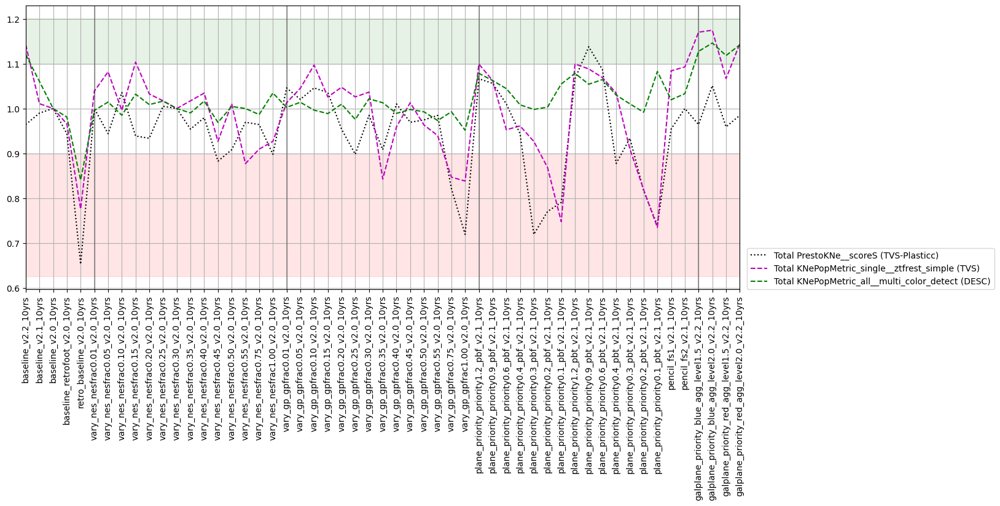

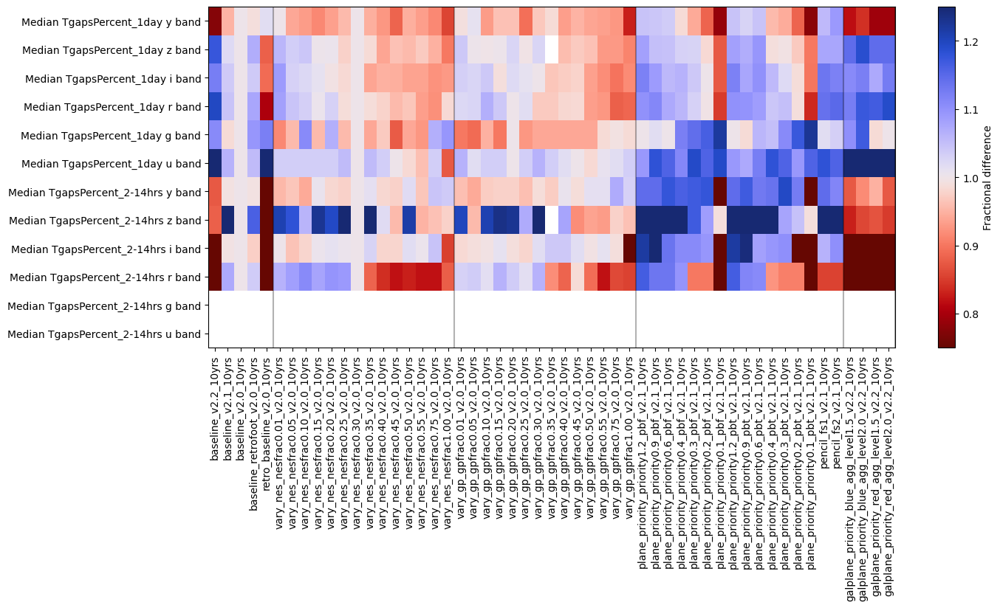

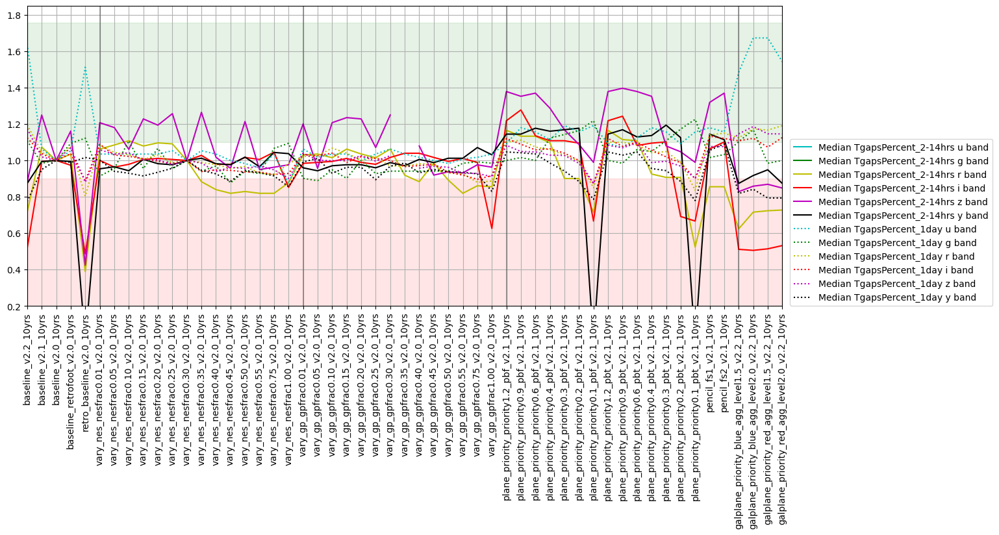

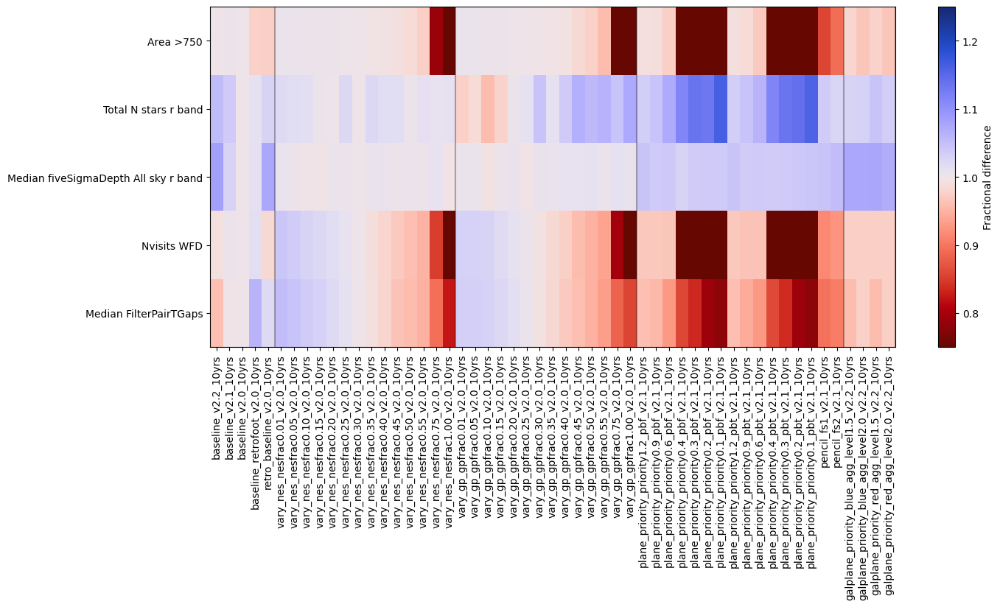

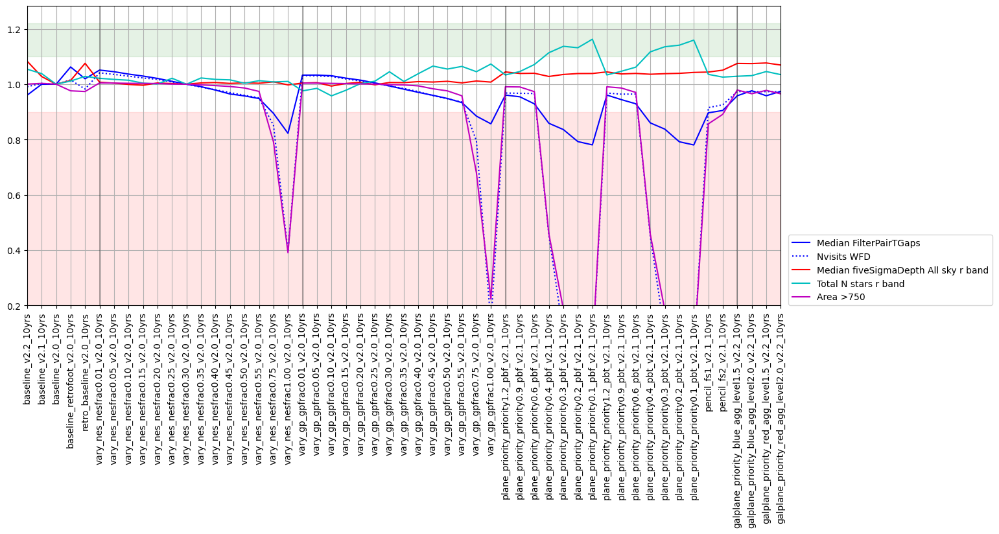

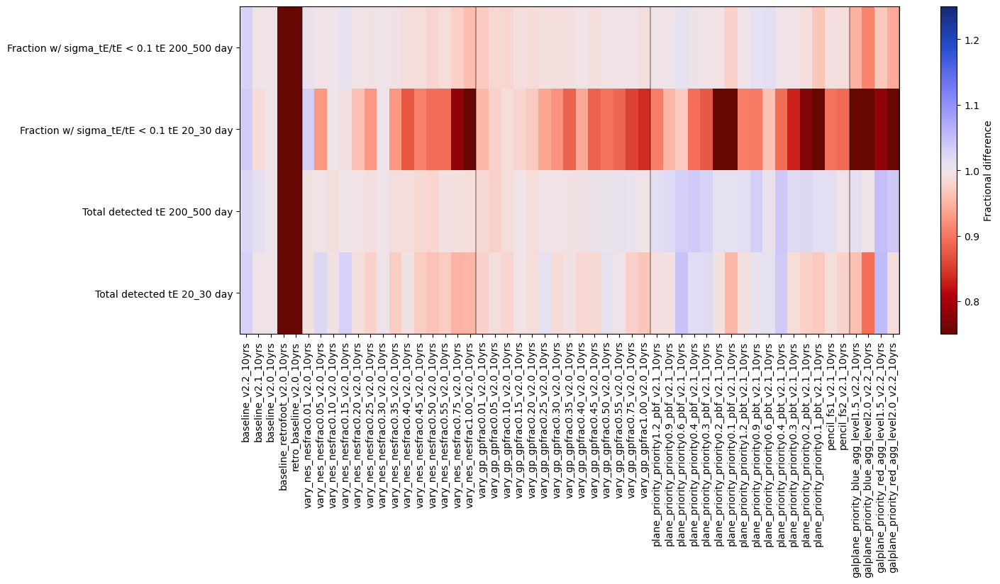

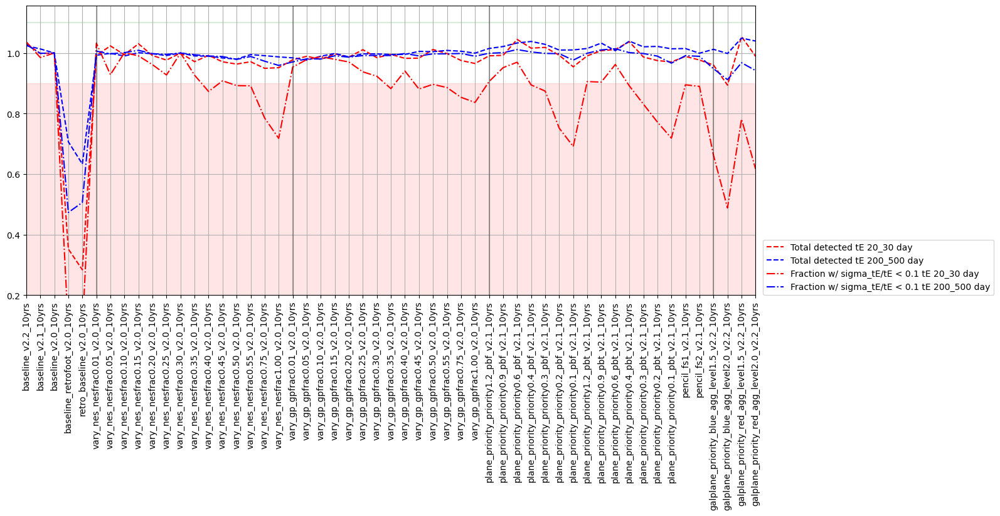

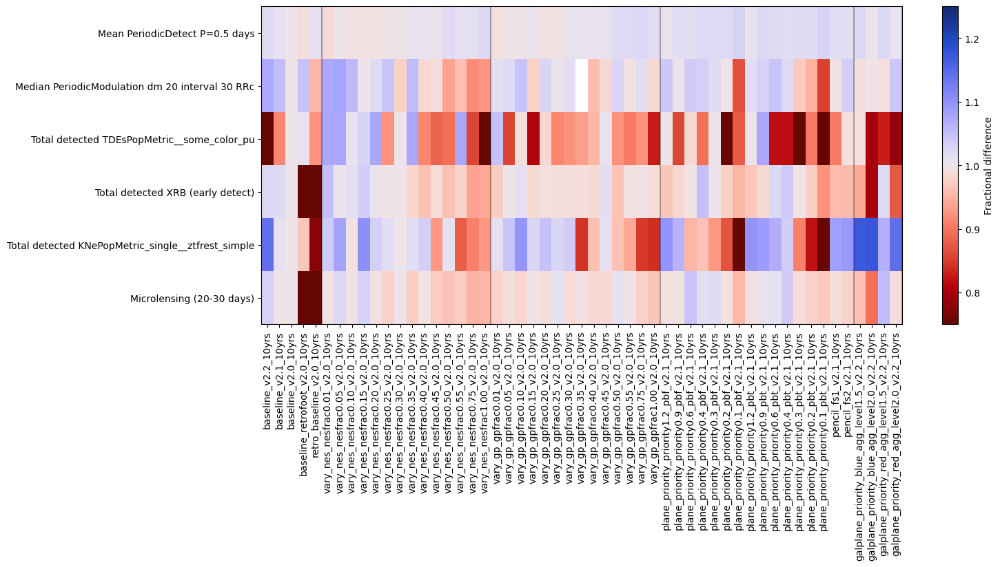

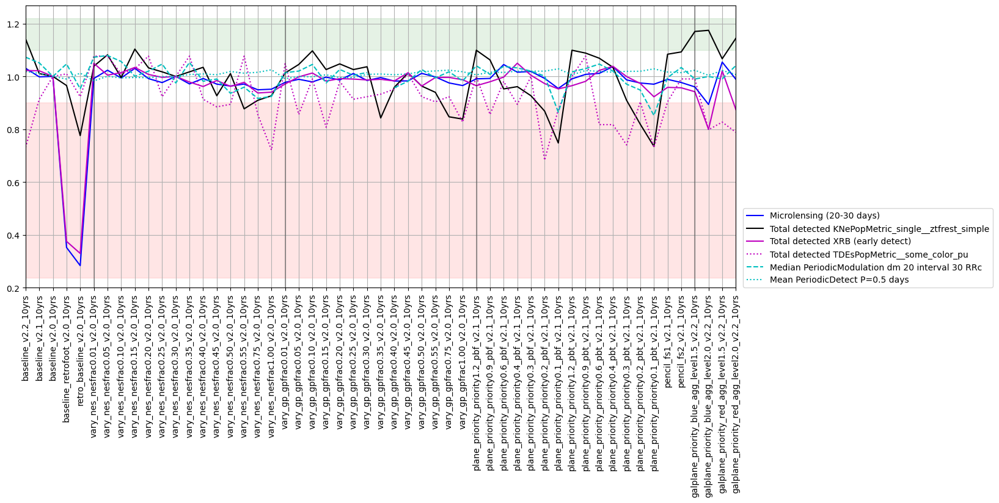

In [33]:
# TVS metrics
k_sets = [k for k in msets if k.startswith('TVS') and (k.endswith('short') or ('Tgaps' in k) or ('anomalies' in k)) ]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    fig.set_figwidth(15)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value', 
                                 shade_fraction=0.1)
    fig.set_figwidth(15)
    ylim = list(ax.get_ylim())
    ax.set_ylim(max(0.2, ylim[0]), min(3, ylim[1]))
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)

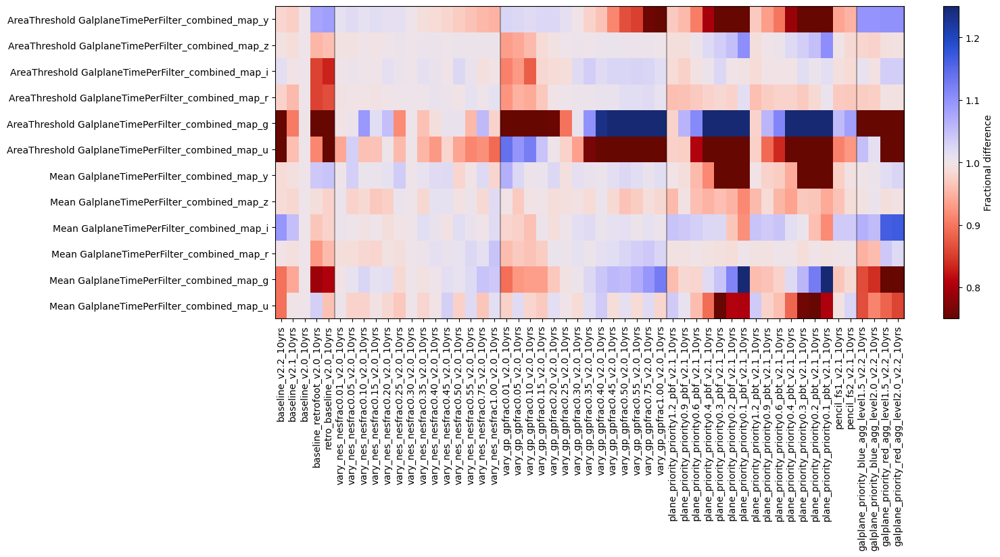

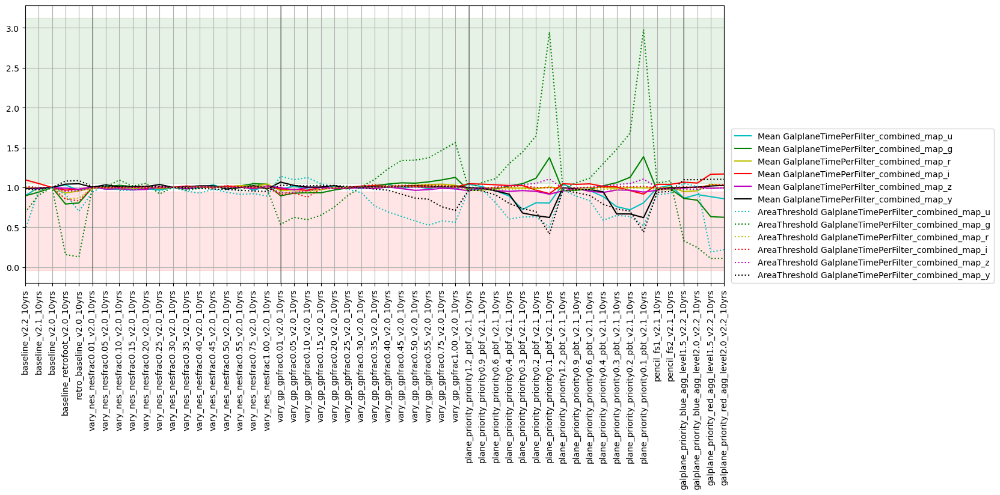

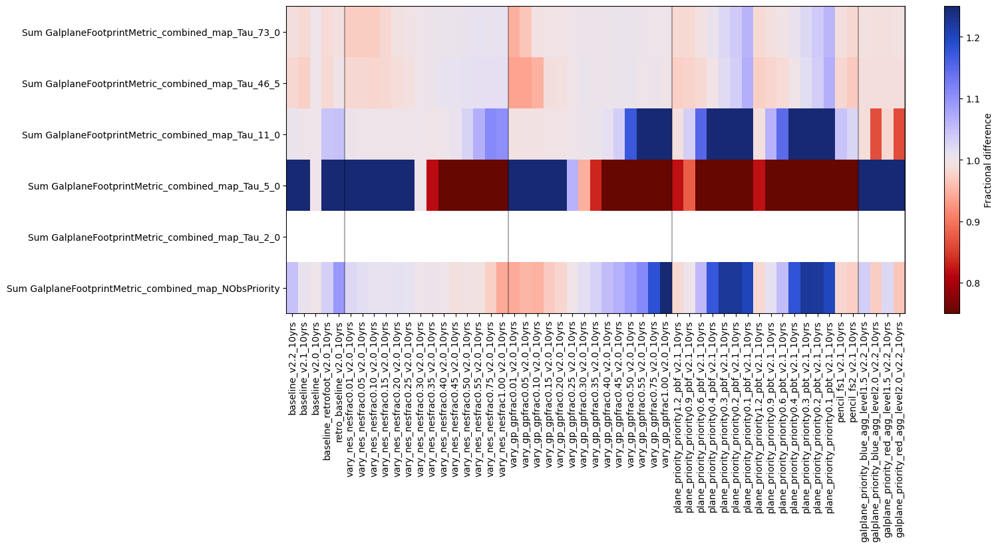

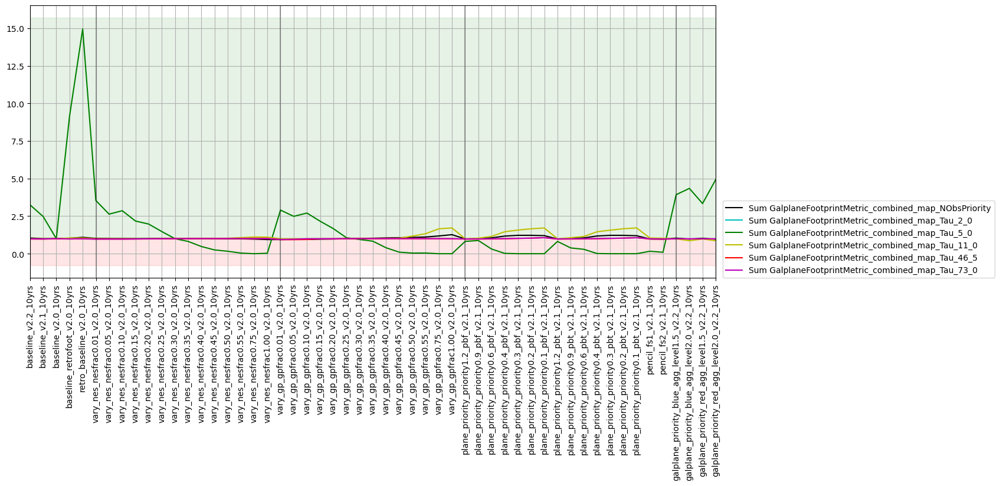

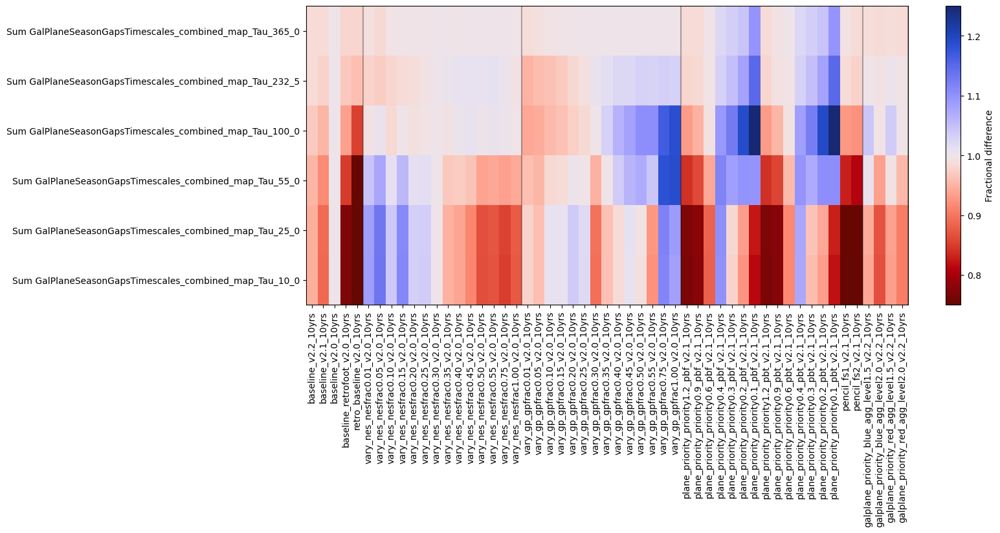

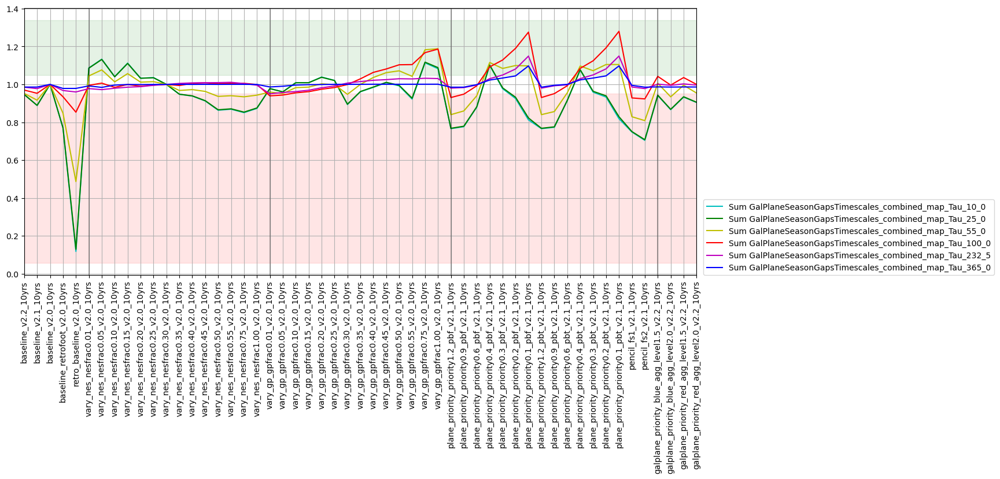

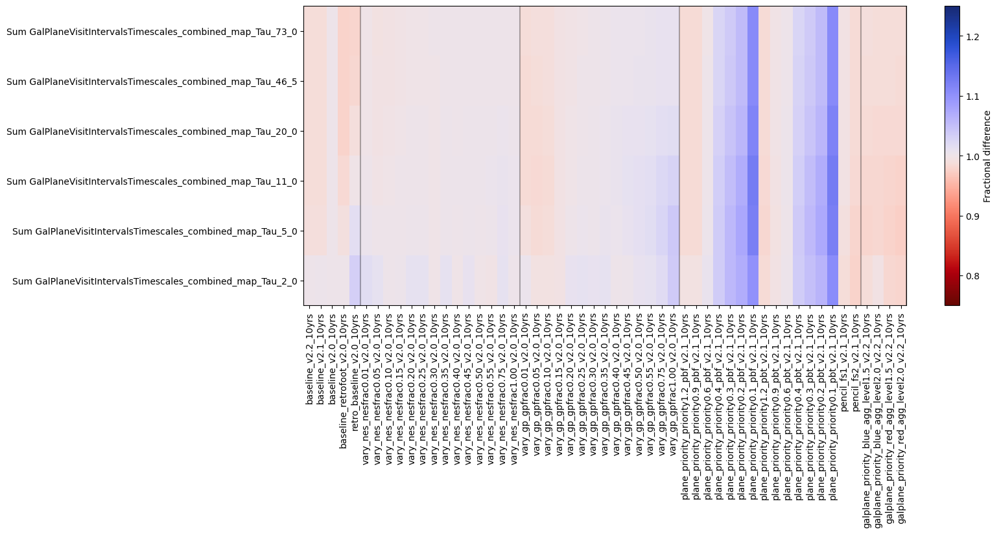

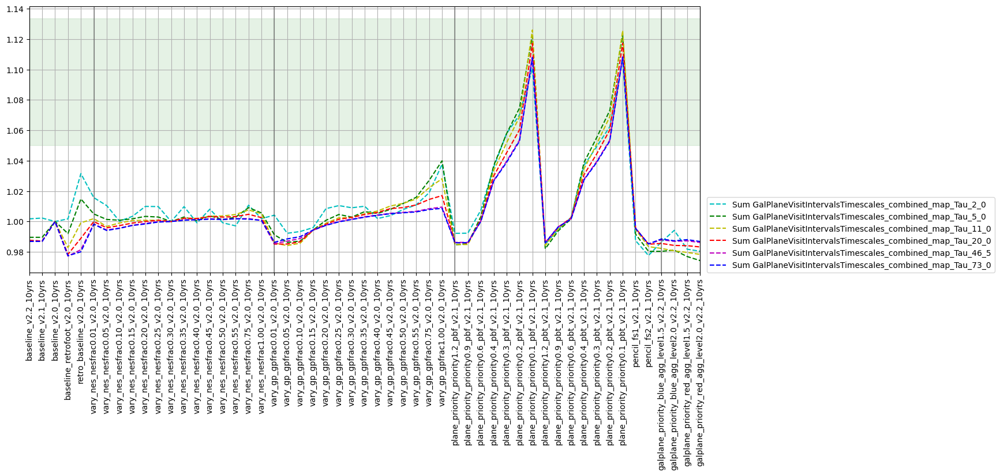

In [34]:
# GP footprint metrics
k_sets = [k for k in msets if k.startswith('GP')]

for k in k_sets:
    msub = metric_sets.loc[k]
    fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                       baseline_run=baseline_run,
                                       metric_label_map=msub['short_name'],
                                       metric_set=msub,
                                      color_range=0.5)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    fig.set_figwidth(15)
    


    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value')
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    fig.set_figwidth(15)
    #ax.set_ylim(0.5, 1.5)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

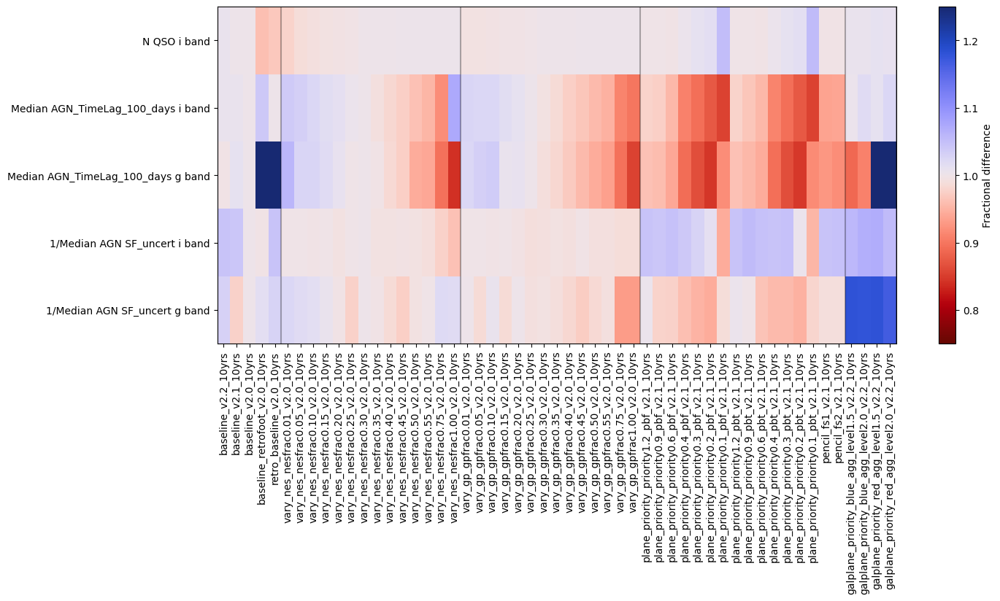

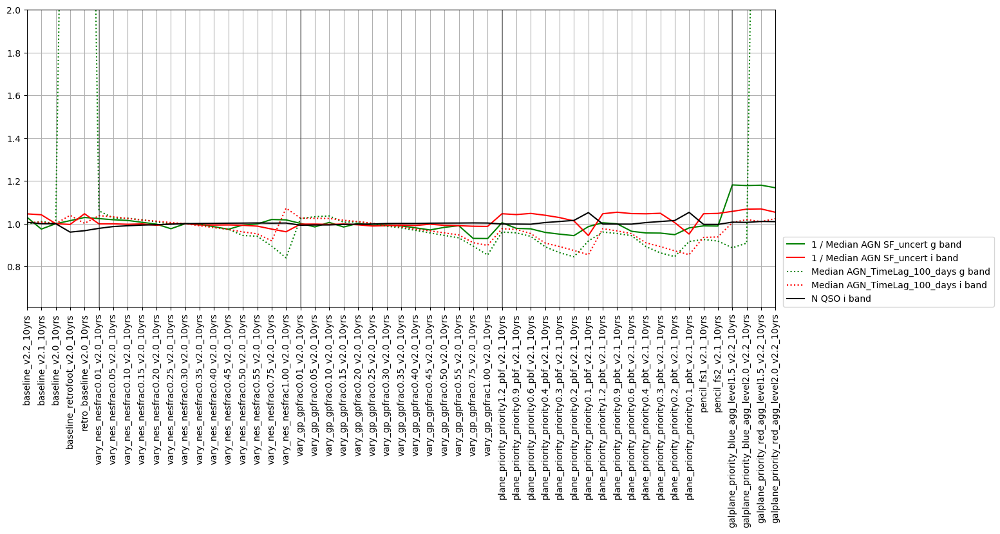

In [35]:
k = 'AGN short'
# AGN metrics
k_sets = ['AGN short']

msub = metric_sets.loc[k_sets].reset_index('metric set')
fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)


for k in k_sets:
    fig, ax = maf.plot_run_metric(summaries.loc[these_runs, metric_sets.loc[k]['metric']], 
                                  baseline_run=baseline_run,
                                  metric_set=metric_sets.loc[k],
                                  metric_label_map=metric_sets.loc[k]['short_name'],
                                 horizontal_quantity='run',
                                 vertical_quantity='value',
                                 shade_fraction=0)
    for l in lines:
        ax.axvline(l, color='k', alpha=0.3)
    ylims = ax.get_ylim()
    ax.set_ylim(max(0.2, ylims[0]), min(2, ylims[1]))
    fig.set_figwidth(15)
    lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')

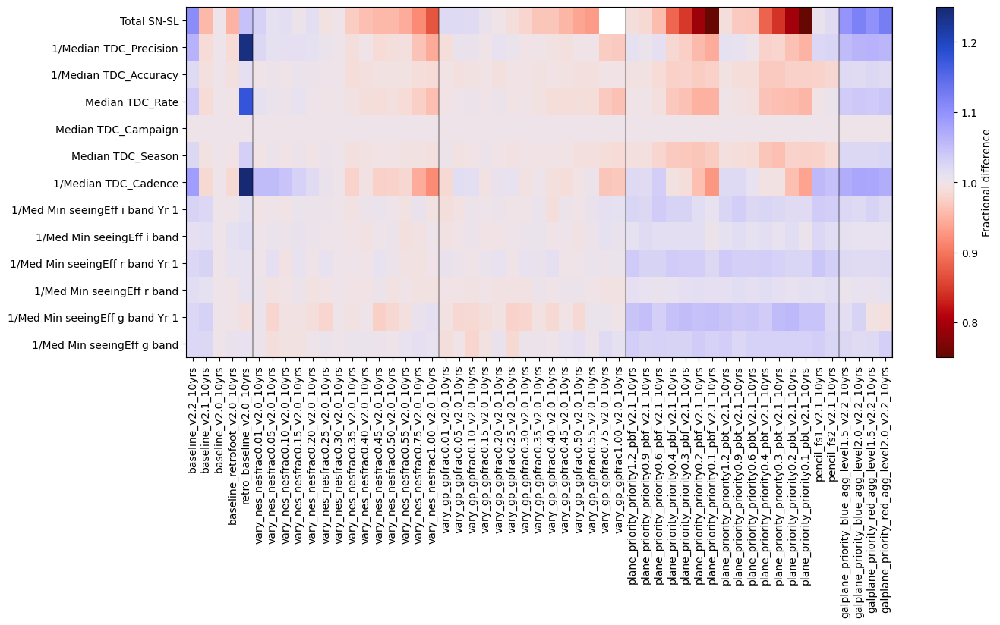

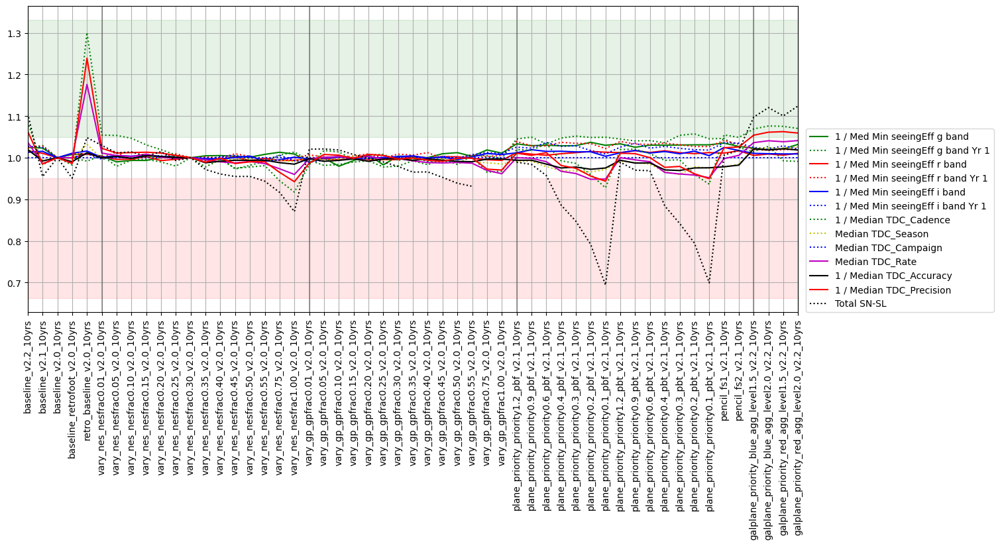

In [36]:
# StrongLensing metrics

k_sets = [k for k in msets if k.startswith('SL')]

msub = metric_sets.loc[k_sets].reset_index('metric set')
# Add the strong lensed supernova metric
msub = pd.concat([msub, 
                  metric_sets.loc['DESC WFD'].query('metric.str.contains("SNSL")', engine='python')])

fig, ax = maf.plot_run_metric_mesh(summaries.loc[these_runs,msub['metric']], 
                                   baseline_run=baseline_run,
                                   metric_label_map=msub['short_name'],
                                   metric_set=msub,
                                  color_range=0.5)
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)



fig, ax = maf.plot_run_metric(summaries.loc[these_runs, msub['metric']], 
                              baseline_run=baseline_run,
                              metric_set=msub,
                              metric_label_map=msub['short_name'],
                             horizontal_quantity='run',
                             vertical_quantity='value')
for l in lines:
    ax.axvline(l, color='k', alpha=0.3)
fig.set_figwidth(15)
#ax.set_ylim(0.5, 1.5)
lgd = plt.legend(loc=(1.01, 0.0), fancybox=True, numpoints=1, fontsize='medium')